# Creating synthetic data: 
## From an actual image sequence (warped, pixels remapped)
#### No need to advect, the image sequence has mean motion in it 

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
from glob import glob 

# https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.map_coordinates.html

import scipy 
from scipy import ndimage

In [4]:
!ls -1 DATA/*9_06*png

DATA/image_0_2022_09_06_15_15_00Z.png
DATA/image_1_2022_09_06_15_45_00Z.png
DATA/image_2_2022_09_06_16_15_00Z.png
DATA/image_3_2022_09_06_16_45_00Z.png
DATA/image_4_2022_09_06_17_15_00Z.png
DATA/image_5_2022_09_06_17_45_00Z.png
DATA/image_6_2022_09_06_18_15_00Z.png
DATA/image_7_2022_09_06_18_45_00Z.png
DATA/image_8_2022_09_06_19_15_00Z.png
DATA/image_9_2022_09_06_19_45_00Z.png


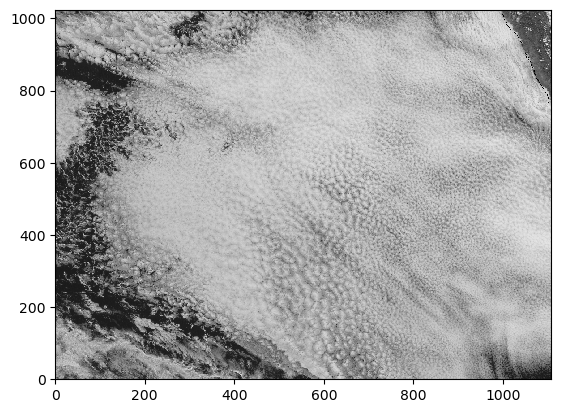

In [5]:
fnames = np.sort( glob('DATA/*9_06*png') )
images = []
for i,fname in enumerate(fnames): 
    img = imageio.v2.imread(fname)
    red = np.flipud(img[0:,400:,0])
    images.append(red)  # just red channel, just 400:end in the x dir, flip y 

plt.pcolormesh(images[0], cmap='Greys_r'); 

In [6]:
# Get the dimensions of the image
height, width = red.shape[:2]

# Create 2D arrays of x and y
x = np.arange(width)
y = np.arange(height)

# Create a meshgrid of x and y
X, Y = np.meshgrid(x, y)


# Pixel size: nominal for MKS units to pixel units 
DX = 2000             # m, pixel size (nominal)

# Xm and Ym are Coordinates in meters, distances measured from central point of image
Xm = (X-X.mean())*DX
Ym = (Y-Y.mean())*DX 

-------------------

# Wave parameters for warping and modulating an image

"In one period, 7–9 October 2008, the waves modulated cloud-top-height by up to 400 m peak-to-trough, propagating perpendicular to the synoptic boundary layer flow with phase speed 15.3 m s−1, period ∼1 h and horizontal wavelength 55 km. The gravity waves were observed to be non-dispersive. “ from https://doi.org/10.1002/qj.1952

For a wave moving toward 45 degrees (northeast), define k and l as positive (sin and cos of nav angle). Let's take z = sin( k(x-ct) + l(y-ct) ) which is indeed moving NEward with time. Then u and v are both positive at z crests (sketch it). That means dx and dy are positve when time is 1/4 period later, or when 90deg of phase have been subtracted since t appears with a negative sign in the formula for phase (x-ct). 

In [7]:
# One wave packet 
cphase = 14            # m/s
wavelength = 150*1000. # meters
period = wavelength/cphase 
direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2*np.pi/wavelength * np.sin( (direction) *np.pi/180 )   
l = 2*np.pi/wavelength * np.cos( (direction) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x = -400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters
packet_width_y  = 300*1000.  # meters
Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 
     
#plt.pcolormesh(Ampwindow); plt.colorbar()

In [8]:
# A second wave packet 
cphase2 = 20            # m/s
wavelength2 = 100*1000. # meters
period2 = wavelength2/cphase2 
direction2 = 140       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude2 = 50      # meters, vertical displacement
PBLdepth2 = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k2 = 2*np.pi/wavelength2 * np.sin( (direction2) *np.pi/180 )   
l2 = 2*np.pi/wavelength2 * np.cos( (direction2) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x2 = 400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y2 = 100*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x2  = 200*1000.  # meters
packet_width_y2  = 600*1000.  # meters
Ampwindow2 = np.exp(-( ((Xm-packet_center_x2)/packet_width_x2)**2 + \
                      ( (Ym-packet_center_y2)/packet_width_y2)**2 )) 
     

## Animation displays for time-dependent warped imagery texture 

In [9]:
# Constants for this animation 
time_steps = 10            # Number of time steps 
time_resolution = 1800     # seconds, images are half an hour apart

# The resulting image arrays, for animation 
grid = np.zeros((height, width, time_steps))


# BUILD THE WARPED MODULATED IMAGES AT EACH TIME

for it in range(time_steps):
    t = it*time_resolution     # t is in seconds 

# dz measures vertical displacements: let's choose the sine function. Two packets 
    dz = zamplitude \
         * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) ) *Ampwindow 
    dz2 = zamplitude2 \
         * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) ) *Ampwindow2

# wave dx and dy are 90deg behind phase with dz, prop. to wavelength. 
# DIRECTION: For 45deg (wave going NE), k>0,l>0, dx>0,dy>0 (sketch it). 

    dxy = (zamplitude/PBLdepth)*wavelength \
          * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) -np.pi/2.) /DX
    dx = dxy * np.sin(direction *np.pi/180.) *Ampwindow # why /2? because it is too strong. Pixel units?? 
    dy = dxy * np.cos(direction *np.pi/180.) *Ampwindow

    dxy2= (zamplitude2/PBLdepth2)*wavelength2 \
          * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) -np.pi/2.) /DX
    dx2= dxy2* np.sin(direction2 *np.pi/180.) *Ampwindow2 
    dy2= dxy2* np.cos(direction2 *np.pi/180.) *Ampwindow2

# Warping by transporting pixels in original red image, wrapping (periodic) for now. SUBTRACT dy and dx in argument. 
    grid[:,:,it] = ndimage.map_coordinates(images[it],[Y-dy-dy2, X-dx-dx2])  

# Modulate (multiply) albedo by a wavy pattern (vertical displacements, 
#           make consistent with xmotion and ymotion arrays above) 
    grid[:,:,it] *= (1 + dz /PBLdepth  *5) 
    grid[:,:,it] *= (1 + dz2/PBLdepth2 *5) 

maxvalue = grid.max()
maxvalue

309.58694301653907

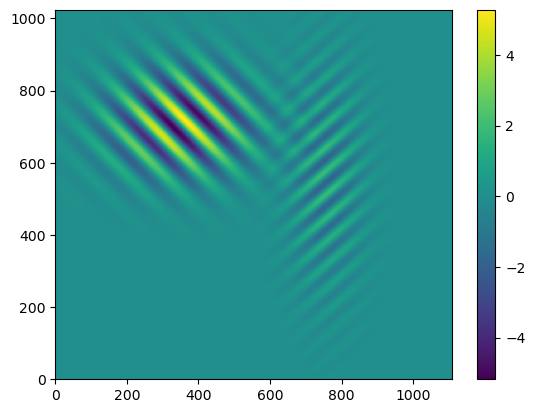

In [10]:
plt.pcolormesh(dy+dy2); plt.colorbar(); # pixels units -- surprising that 7 pixels make such a huge warp?

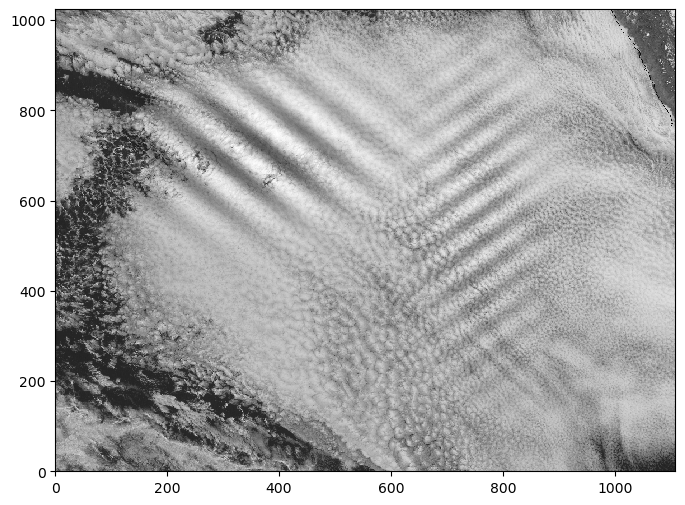

In [11]:
plt.figure(figsize=(8,6))
plt.pcolormesh(grid[:,:,0], cmap='Greys_r')

# Display it! 

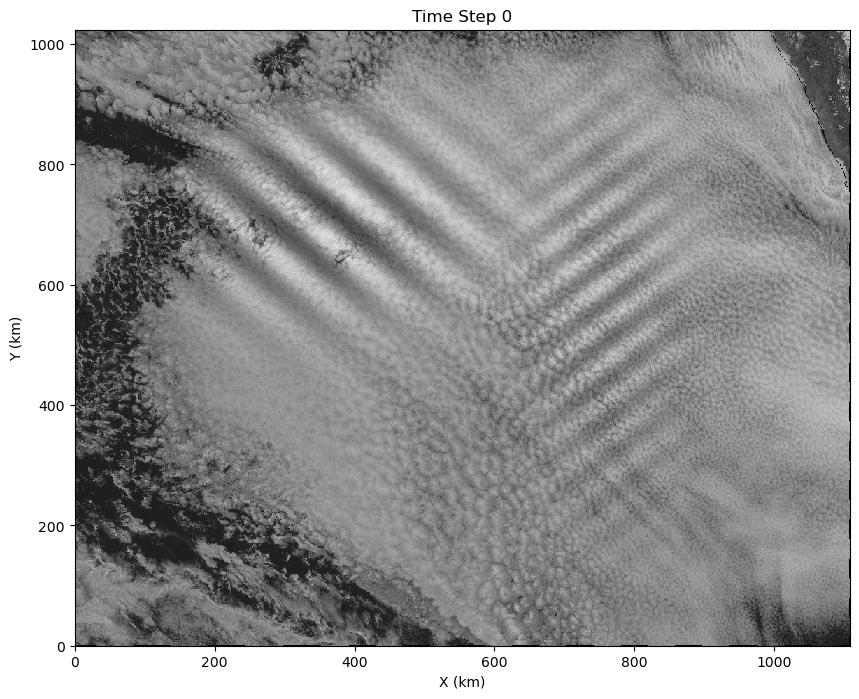

In [115]:
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 8))  

# Function to initialize the animation 
def init():
    im = ax.pcolormesh(grid[:, :, 0],vmin=0,vmax=maxvalue,cmap='Greys_r');
    plt.title(f'Time Step 0')
    plt.xlabel('X (km)')
    plt.ylabel('Y (km)')
    return [im]

# Function to animate the frames
def animate(it):
    im = ax.pcolormesh(grid[:, :, it],vmin=0,vmax=maxvalue,cmap='Greys_r')
    plt.title(f'Time Step {t}')
    return [im]

# Create an animation
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=grid.shape[2], repeat=True)

# Display the animation in the Jupyter Notebook
HTML(ani.to_jshtml())


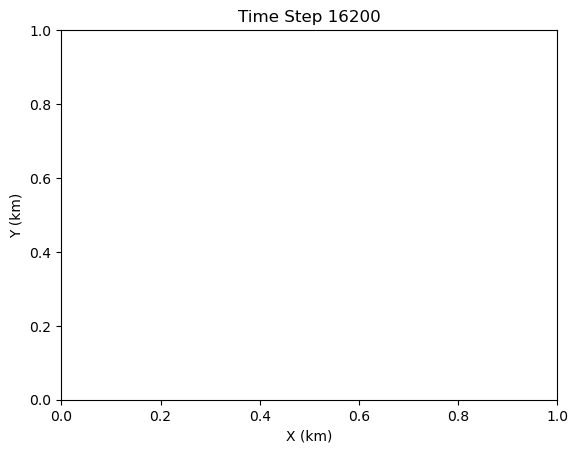

In [118]:
ani.save('/Users/bmapes/GitHub/stratocu_waves/DATA/syn_scwave_warp_modx5.mp4',writer='ffmpeg', fps=5)

# Wavelet experimentation



In [12]:
import numpy as np
import pywt
import py_cwt2d
from matplotlib import pyplot as plt

In [20]:
# Subsample to 512x512 to match example 
np.flipud(grid[::2,::2,0][:512,:512]).shape

(512, 512)

In [66]:
# Vignette to reduce edge effects, but too crude, not used 
XX,YY = np.meshgrid(range(512),range(512))
dist = (XX-256)**2 + (YY-256)**2
mask = np.exp(-dist/256/256)

In [67]:
image = np.flipud(grid[::2,::2,0][:512,:512])  #*mask

# set up a range of scales in logarithmic spacing between 1 and 256 (image width / 2 seems to work here)
# small ss apparently means small scale
ss = np.geomspace(1.0,256.0,100)

# calculate the complex pycwt, and make the wavelet normalization factor CC
coeffs, wav_norm = py_cwt2d.cwt_2d(image, ss, 'mexh')

# normalization factor for each contribution in reconstruction. Is it right? from web repo as found 
CC = 1.0 / (ss * wav_norm) 

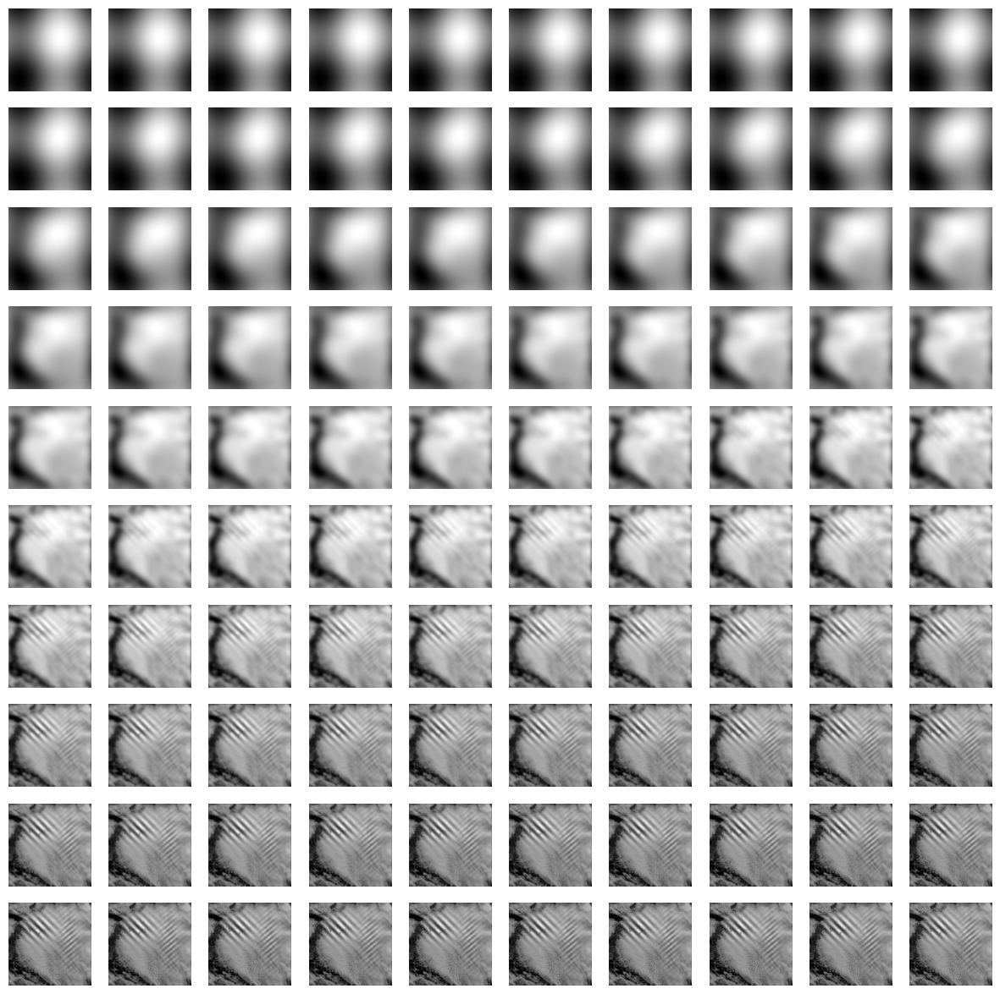

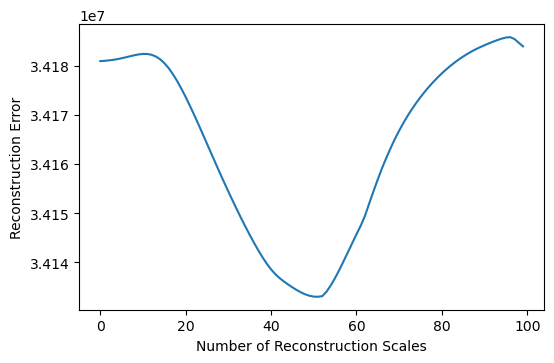

In [68]:
# Show a cumulative reconstruction with truncation level 

errors = [] # container to hold the errors by truncation level 

N = 10  # 10x10 thumbnails, since ss was defined to include 100 scales 

# Plot a successive reconstruction by truncation level
# LARGE TO SMALL scales, reversed(range())

fig, axes = plt.subplots(nrows=N, ncols=N, figsize=(15, 15))

for level in reversed( range(len(ss)) ):
    i = level // N
    j = level % N

# Prepare each thumbnail's area and disable ticks & labels 
    plt.sca(axes[N-1-i, N-1-j]); plt.axis('off')

# Weighted sum is a reconstruction to this truncation level 
    C = CC[level:]
    reconstruction = (C * np.real(coeffs[..., level:])).sum(axis=-1)

# rescale reconstruction to [0,1 range]
# needed since wavelets x scales are not orthogonal
    reconstruction = 1.0 - (reconstruction - reconstruction.min())/ \
                     (reconstruction.max() - reconstruction.min() + 1e-6) # 1e9 prevents /0 error 

# Measure error: fancy power or plain MAE
#    errors.append(np.sqrt(np.sum(np.power(reconstruction - image, 2.0))))
    errors.append(np.mean(np.sum(np.abs(reconstruction - image))))

# Thumbnail image: same [0,1] range in each 
    plt.imshow(reconstruction, cmap='gray', vmin=0, vmax=1)
    
plt.show()

# Second plot: errors as a function of truncation level 
fig2, ax2 = plt.subplots(nrows=1, ncols=1, figsize=(6, 6/1.618))
plt.plot(errors)
plt.xlabel('Number of Reconstruction Scales')
plt.ylabel('Reconstruction Error')
plt.show()

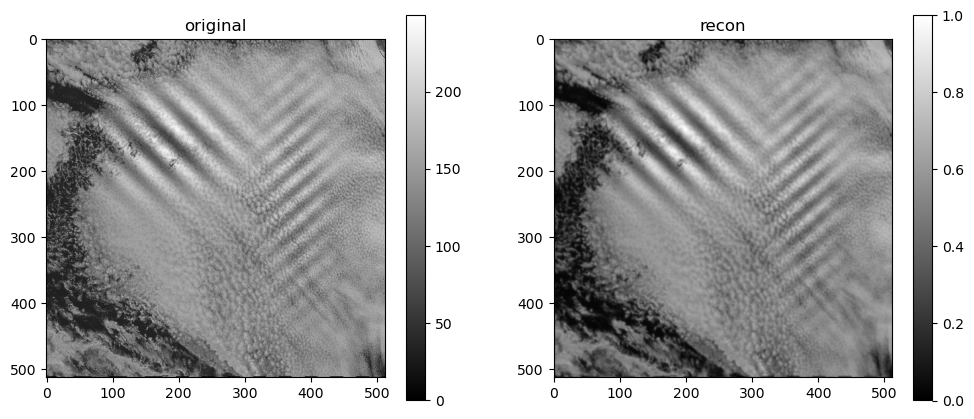

In [69]:
plt.figure( figsize=(12,5) )

plt.subplot(1,2,1)
plt.imshow(image, cmap='gray'); plt.colorbar(); plt.title('original')
plt.subplot(1,2,2)
plt.imshow(reconstruction, cmap='gray'); plt.colorbar(); plt.title('recon');

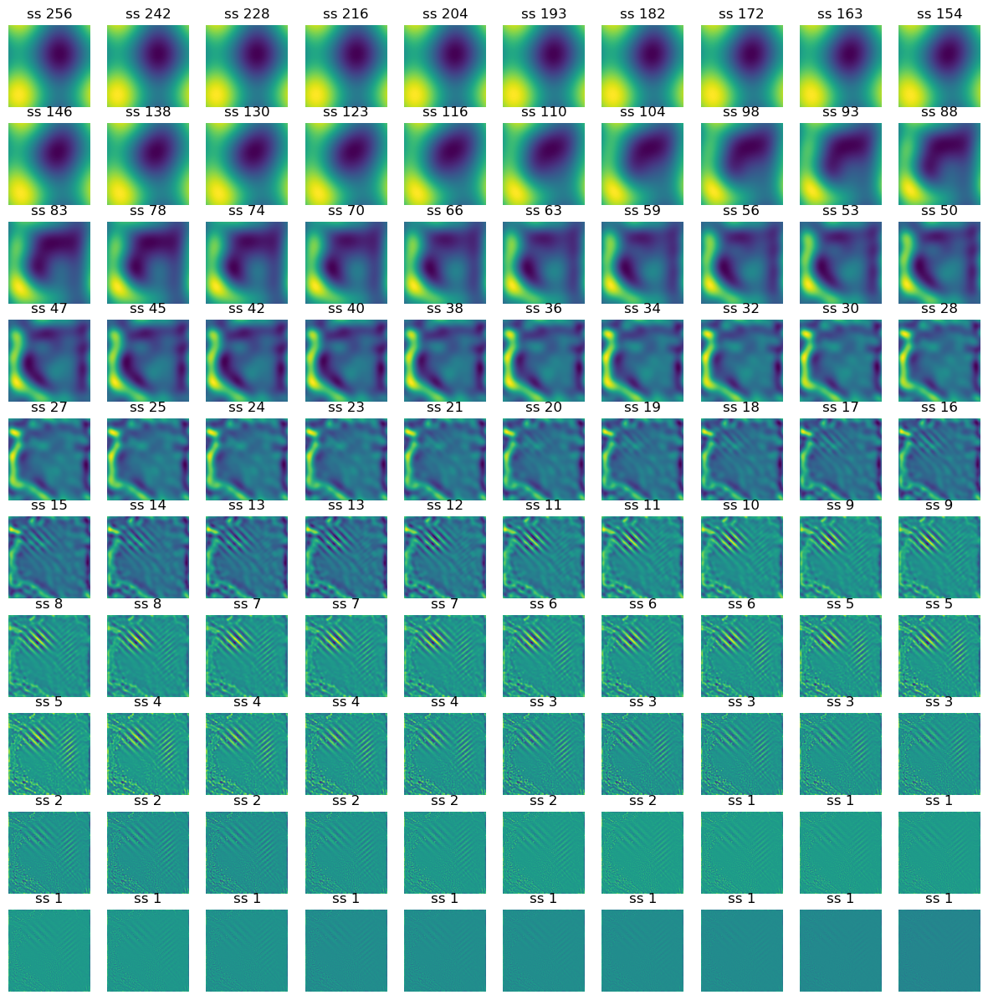

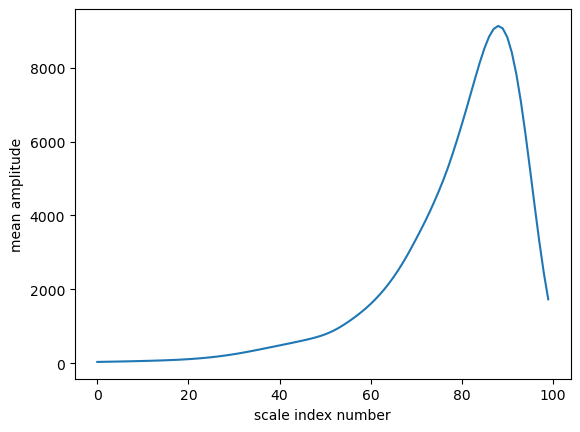

In [70]:
# Scale by scale coefficients, not cumulated, identical color scales [-256,256]

meanamps = [] # container to hold the errors by truncation level 

fig, axes = plt.subplots(nrows=N, ncols=N, figsize=(15, 15))

for level in ( range(len(ss)) ):
    i = level // N
    j = level % N
    
    plt.sca(axes[N-1-i, N-1-j])
    plt.axis('off')
    plt.imshow( np.real(coeffs[:,:,level])) #, vmin=-256,vmax=256) #, cmap='gray')
    plt.title( 'ss '+str(int(ss[level])) )

# Measure area-mean amplitude at this scale (level) 
    meanamps.append( np.mean(np.abs(coeffs[:,:,level])) )
    
plt.show()

# Second plot: amplitudes as a function of scale  
plt.plot(meanamps)
plt.xlabel('scale index number')
plt.ylabel('mean amplitude');

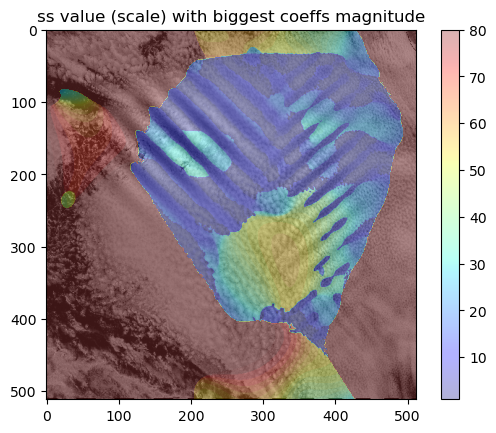

In [77]:
# At each point, what scale has largest amlitude? 
plt.imshow(image, cmap='gray')

#plt.imshow( np.real(coeffs).max(axis=-1), alpha=0.5); plt.colorbar();   # the big amplitude
#plt.imshow( np.real(coeffs).argmax(axis=-1), alpha=0.5); plt.colorbar(); # the scale number it occurs at

plt.imshow( ss[np.real(coeffs).argmax(axis=-1)], alpha=0.3, vmax=80, cmap='jet'); 
plt.colorbar(); # the ss it occurs at

plt.title('ss value (scale) with biggest coeffs magnitude');

In [72]:
# Vignette to reduce edge effects 
XX,YY = np.meshgrid(range(512),range(512))
dist = (XX-256)**2 + (YY-256)**2
mask = np.exp(-dist/256/256)

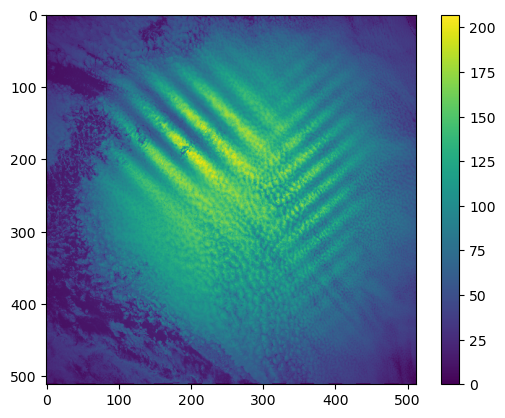

In [73]:
plt.imshow(image*mask); plt.colorbar();

In [ ]:
vign = reconstruction*mask

In [355]:
import pywt
# pywt.wavelist(kind='discrete') 

In [208]:
# https://www.mathworks.com/help/wavelet/gs/choose-a-wavelet.html?searchHighlight=sym%20wavelet&s_tid=srchtitle_support_results_1_sym%20wavelet

wsym20 = pywt.Wavelet('sym20')
wsym2 = pywt.Wavelet('sym2')

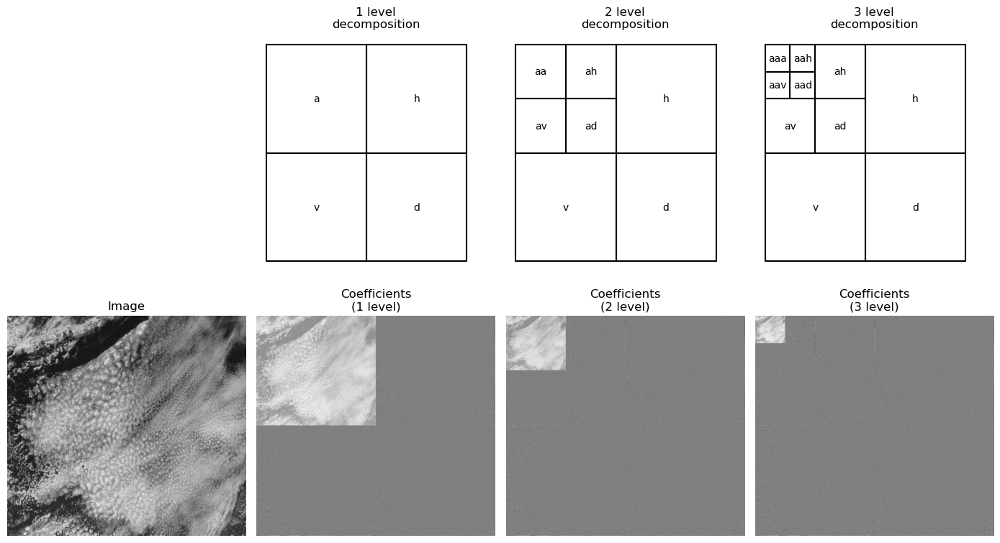

In [187]:
# example from 
# https://pywavelets.readthedocs.io/en/latest/ref/2d-decompositions-overview.html

from pywt._doc_utils import draw_2d_wp_basis, wavedec2_keys

x = red
shape = x.shape

max_lev = 3       # how many levels of decomposition to draw
label_levels = 3  # how many levels to explicitly label on the plots

fig, axes = plt.subplots(2, 4, figsize=[14, 8])
for level in range(max_lev + 1):
    if level == 0:
        # show the original image before decomposition
        axes[0, 0].set_axis_off()
        axes[1, 0].imshow(x, cmap=plt.cm.gray)
        axes[1, 0].set_title('Image')
        axes[1, 0].set_axis_off()
        continue

    # plot subband boundaries of a standard DWT basis
    draw_2d_wp_basis(shape, wavedec2_keys(level), ax=axes[0, level],
                     label_levels=label_levels)
    axes[0, level].set_title(f'{level} level\ndecomposition')

    # compute the 2D DWT
    c = pywt.wavedec2(x, 'db2', mode='periodization', level=level)
    # normalize each coefficient array independently for better visibility
    c[0] /= np.abs(c[0]).max()
    for detail_level in range(level):
        c[detail_level + 1] = [d/np.abs(d).max() for d in c[detail_level + 1]]
    # show the normalized coefficients
    arr, slices = pywt.coeffs_to_array(c)
    axes[1, level].imshow(arr, cmap=plt.cm.gray)
    axes[1, level].set_title(f'Coefficients\n({level} level)')
    axes[1, level].set_axis_off()

plt.tight_layout()
plt.show()


# Wavelet packet analysis 

https://pywavelets.readthedocs.io/en/latest/ref/wavelet-packets.html#pywt.WaveletPacket2D

Explanations 

Basic: 

https://www.mathworks.com/help/wavelet/ug/wavelet-packets.html

https://www.sciencedirect.com/topics/computer-science/wavelet-packet-transform

https://www.mathworks.com/help/wavelet/ug/wavelet-packets-decomposing-the-details.html

https://www.mathworks.com/help/wavelet/ug/about-wavelet-packet-analysis.html

2D: 

https://www.mathworks.com/help/wavelet/ug/two-dimensional-wavelet-packet-analysis.html

https://www.mathworks.com/help/wavelet/ref/wpdec2.html



In [349]:
# Wavelet packets, nodes of a tree with several levels 
wp = pywt.WaveletPacket2D(data=red, wavelet='sym2', mode='zero')

In [350]:
wp.get_level(2)

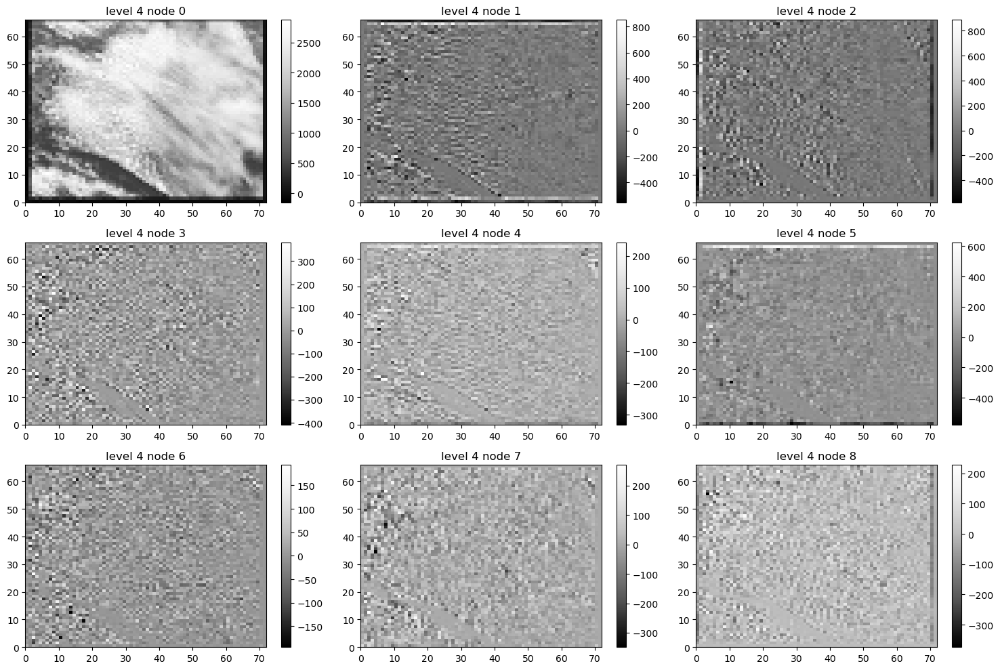

In [360]:
level = 4

plt.figure( figsize=(15,10) )

for inode in range(9): 
    plt.subplot(3,3,inode+1) 
    plt.pcolormesh(wp.get_level(level)[inode].reconstruct(), cmap='Greys_r')
    plt.title('level '+str(level)+' node '+str(inode)); plt.colorbar()

plt.tight_layout()

# Try the complex Morlet or Gaussian
### continuous wavelets best for diagnosis

In [416]:
image = red.transpose()  # it doesn't seem to be isotropic on x vs. y?

In [413]:
wc = pywt.ContinuousWavelet('cgau8')

scales = np.arange(10, 1000, 100) # Selecting a few representative scales

coefficients, frequencies = pywt.cwt(image, scales, wc)
magnitude = np.abs(coefficients[0])  # Take the magnitude of the complex coefficients

In [414]:
coefficients.shape

(20, 1108, 1024)

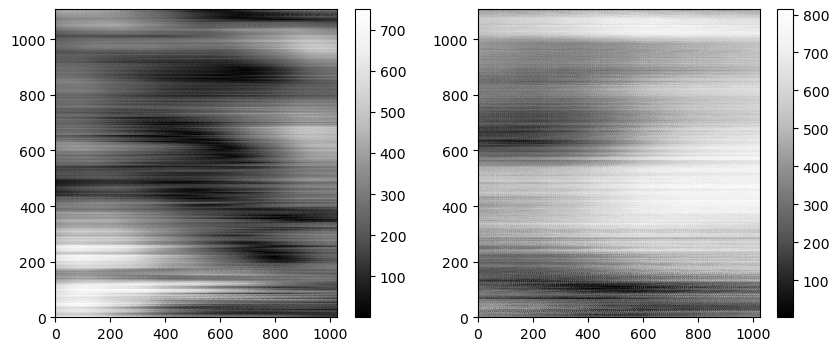

In [415]:
plt.figure( figsize=(10,4) )

plt.subplot(121)
plt.pcolormesh(np.abs(coefficients[5]), cmap='Greys_r'); plt.colorbar()
#plt.contour   (np.imag(coefficients[0]), 5, alpha=0.5)

plt.subplot(122)
plt.pcolormesh(np.abs(coefficients[15]), cmap='Greys_r'); plt.colorbar()
#plt.contour   (np.imag(coefficients[4]), 5, alpha=0.5)

In [381]:
coefficients.squeeze().shape

(1024, 1108)

In [382]:
pywt.cwt

Signature:
pywt.cwt(
    data,
    scales,
    wavelet,
    sampling_period=1.0,
    method='conv',
    axis=-1,
)
Docstring:
cwt(data, scales, wavelet)

One dimensional Continuous Wavelet Transform.

Parameters
----------
data : array_like
    Input signal
scales : array_like
    The wavelet scales to use. One can use
    ``f = scale2frequency(wavelet, scale)/sampling_period`` to determine
    what physical frequency, ``f``. Here, ``f`` is in hertz when the
    ``sampling_period`` is given in seconds.
wavelet : Wavelet object or name
    Wavelet to use
sampling_period : float
    Sampling period for the frequencies output (optional).
    The values computed for ``coefs`` are independent of the choice of
    ``sampling_period`` (i.e. ``scales`` is not scaled by the sampling
    period).
method : {'conv', 'fft'}, optional
    The method used to compute the CWT. Can be any of:
        - ``conv`` uses ``numpy.convolve``.
        - ``fft`` uses frequency domain convolution.
        - ``aut

In [1]:
# Select image
image = red

# Define the scales for the continuous wavelet transform
# The desired feature sizes are 30 km and 300 km.
# Convert these to pixel scales: 30 km / 2 km/pixel = 15 pixels and 300 km / 2 km/pixel = 150 pixels

# scales = np.arange(15, 151, 15)  # Trying scales from 15 to 150 pixels in steps of 15 pixels
scales = np.arange(15, 151, 27) # Selecting a few representative scales

# Different settings for B and C parameters of the complex Morlet wavelet
wavelet_settings = [
    ('cmor1.0-1.0', 'Narrow Bdwidth, Higher Freq'),
    ('cmor2.0-0.5', 'Wider Bdwidth, Lower Freq'),
    ('cmor1.5-0.8', 'Balanced Approach')
]

for wavelet_name, description in wavelet_settings:
    wavelet = pywt.ContinuousWavelet(wavelet_name)

    fig, axes = plt.subplots(1, len(scales) + 1, figsize=(20, 5))

    # Plot the original processed image
    axes[0].pcolormesh(image, cmap='Greys_r')
    axes[0].set_title('Original Processed Image')
    axes[0].set_aspect('equal')

    # Apply the continuous wavelet transform (CWT) with the complex Morlet wavelet for different scales
    for i, scale in enumerate(scales):
        coefficients, frequencies = pywt.cwt(image, [scale], wavelet)
        magnitude = np.abs(coefficients[0])  # Take the magnitude of the complex coefficients
        axes[i + 1].pcolormesh(magnitude, cmap='Greys_r')
        axes[i + 1].set_title(f'Scale {scale} pixels\n{description}')
        axes[i + 1].set_aspect('equal')

    plt.tight_layout()
    plt.show()


kl_inf = 0
kl_sup = 1
c_inf = 12
c_sup = 16

images_filtered = filter_frames(grid, kl_inf, kl_sup, c_inf, c_sup)

Visualize_Filter(grid,grid[0],kl_cutoff_inf=kl_inf,kl_cutoff_sup=kl_sup, c_cutoff_inf=c_inf, c_cutoff_sup=c_sup, Amp=False)

import pywt

# Select the first processed image
image = images_filtered[:,:,0]

# Define the scales for the continuous wavelet transform
# The desired feature sizes are 30 km and 300 km.
# Convert these to pixel scales: 30 km / 2 km/pixel = 15 pixels and 300 km / 2 km/pixel = 150 pixels

# scales = np.arange(15, 151, 15)  # Trying scales from 15 to 150 pixels in steps of 15 pixels
scales = np.arange(15, 151, 27) # Selecting a few representative scales

# Different settings for B and C parameters of the complex Morlet wavelet
wavelet_settings = [
    ('cmor1.0-1.0', 'Narrow Bdwidth, Higher Freq'),
    ('cmor2.0-0.5', 'Wider Bdwidth, Lower Freq'),
    ('cmor1.5-0.8', 'Balanced Approach')
]

for wavelet_name, description in wavelet_settings:
    wavelet = pywt.ContinuousWavelet(wavelet_name)

    fig, axes = plt.subplots(1, len(scales) + 1, figsize=(20, 5))

    # Plot the original processed image
    axes[0].pcolormesh(image, cmap='Greys_r')
    axes[0].set_title('Original Processed Image')
    axes[0].set_aspect('equal')

    # Apply the continuous wavelet transform (CWT) with the complex Morlet wavelet for different scales
    for i, scale in enumerate(scales):
        coefficients, frequencies = pywt.cwt(image, [scale], wavelet)
        magnitude = np.abs(coefficients[0])  # Take the magnitude of the complex coefficients
        axes[i + 1].pcolormesh(magnitude, cmap='Greys_r')
        axes[i + 1].set_title(f'Scale {scale} pixels\n{description}')
        axes[i + 1].set_aspect('equal')

    plt.tight_layout()
    plt.show()




NameError: name 'red' is not defined